In [1]:
# Import packages
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from tqdm import tqdm
import datetime

In [2]:
Def_trade_Kastner = pd.read_excel('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Generated_results/Trade models/DeDuCE_TK (processed).xlsx')

In [3]:
Def_trade_Kastner = Def_trade_Kastner.loc[Def_trade_Kastner['Year'] == 2022]
Def_trade_Kastner = Def_trade_Kastner.groupby(['Producer country', 'Consumer country']).sum().reset_index()

/tmp/user/1011/ipykernel_1267941/2643424845.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  Def_trade_Kastner = Def_trade_Kastner.groupby(['Producer country', 'Consumer country']).sum().reset_index()


In [4]:
Def_trade_Kastner = Def_trade_Kastner.loc[(Def_trade_Kastner['Producer country'] != Def_trade_Kastner['Consumer country'])]

In [5]:
Def_trade_Kastner = Def_trade_Kastner.reset_index(drop=True)

In [6]:
Coord = pd.read_excel('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Country, Lat, Lon.xlsx')

In [7]:
Def_trade_Kastner['start_lat'] = Def_trade_Kastner['Producer country'].map(Coord.set_index('COUNTRY')['Latitude'])
Def_trade_Kastner['start_lon'] = Def_trade_Kastner['Producer country'].map(Coord.set_index('COUNTRY')['Longitude'])

Def_trade_Kastner['end_lat'] = Def_trade_Kastner['Consumer country'].map(Coord.set_index('COUNTRY')['Latitude'])
Def_trade_Kastner['end_lon'] = Def_trade_Kastner['Consumer country'].map(Coord.set_index('COUNTRY')['Longitude'])

In [8]:
Def_trade_Kastner.loc[Def_trade_Kastner['Deforestation emissions incl. peat drainage (MtCO2)'] <= 0] = 0

In [9]:
Def_trade_Kastner['Relative Emissions'] = Def_trade_Kastner['Deforestation risk (ha)']/Def_trade_Kastner['Deforestation risk (ha)'].max()*100

In [10]:
Def_trade_Kastner

,Producer country,Consumer country,Year,Deforestation risk (ha),Deforestation emissions incl. peat drainage (MtCO2),start_lat,start_lon,end_lat,end_lon,Relative Emissions
0,Albania,Germany,2022,0.975434,0.000386,40.949213,20.091451,51.163818,10.447831,0.000535
1,Albania,Italy,2022,4.510688,0.001786,40.949213,20.091451,42.638426,12.674297,0.002472
2,Albania,United States,2022,1.931379,0.000765,40.949213,20.091451,39.783730,-100.445882,0.001059
3,Angola,Democratic Republic of the Congo,8088,6.759546,0.002006,-11.877577,17.569124,-2.981434,23.822264,0.003705
4,Angola,Portugal,2022,0.865294,0.000258,-11.877577,17.569124,39.662165,-8.135352,0.000474
...,...,...,...,...,...,...,...,...,...,...
6017,Zimbabwe,South Africa,8088,11.962954,0.002769,-18.455496,29.746841,-28.816624,24.991639,0.006557
6018,Zimbabwe,Swaziland,2022,0.572570,0.000153,-18.455496,29.746841,-26.562481,31.399132,0.000314
6019,Zimbabwe,United States,2022,1.057475,0.000143,-18.455496,29.746841,39.783730,-100.445882,0.000580
6020,Zimbabwe,Vietnam,2022,0.514087,0.000138,-18.455496,29.746841,15.926666,107.965086,0.000282


In [11]:
grouped_producer = Def_trade_Kastner[['Producer country', 'Deforestation risk (ha)']].groupby(['Producer country']).sum(numeric_only=True).reset_index()
grouped_producer['start_lat'] = grouped_producer['Producer country'].map(Coord.set_index('COUNTRY')['Latitude'])
grouped_producer['start_lon'] = grouped_producer['Producer country'].map(Coord.set_index('COUNTRY')['Longitude'])

grouped_consumer = Def_trade_Kastner[['Consumer country', 'Deforestation risk (ha)']].groupby(['Consumer country']).sum(numeric_only=True).reset_index()
grouped_consumer['start_lat'] = grouped_consumer['Consumer country'].map(Coord.set_index('COUNTRY')['Latitude'])
grouped_consumer['start_lon'] = grouped_consumer['Consumer country'].map(Coord.set_index('COUNTRY')['Longitude'])

In [12]:
# Find the maximum value in the combined dataset for normalization
max_value = max(grouped_producer['Deforestation risk (ha)'].max(), 
                grouped_consumer['Deforestation risk (ha)'].max())

In [13]:
max_value

368347.9892203376

In [14]:
grouped_producer['Relative Emissions'] = grouped_producer['Deforestation risk (ha)']/max_value*100
grouped_consumer['Relative Emissions'] = grouped_consumer['Deforestation risk (ha)']/max_value*100

In [15]:
Def_trade_Kastner = Def_trade_Kastner.loc[Def_trade_Kastner['Producer country'] != 0]

In [16]:
Def_trade_Kastner.sort_values(by = 'Relative Emissions')

,Producer country,Consumer country,Year,Deforestation risk (ha),Deforestation emissions incl. peat drainage (MtCO2),start_lat,start_lon,end_lat,end_lon,Relative Emissions
5003,Spain,Mali,2022,0.469319,0.000130,39.326068,-4.837979,16.370036,-2.290024,0.000257
2814,Italy,Malaysia,2022,0.469792,0.000101,42.638426,12.674297,4.569375,102.265682,0.000257
4846,Rwanda,Ethiopia,2022,0.470262,0.000184,-1.964663,30.064436,10.211670,38.652120,0.000258
1856,Estonia,Tanzania,2022,0.470327,0.000171,58.752378,25.331908,-6.524712,35.787844,0.000258
4065,Panama,Saudi Arabia,2022,0.470591,0.000165,8.559559,-81.130843,25.624262,42.352833,0.000258
...,...,...,...,...,...,...,...,...,...,...
713,Cambodia,China,16176,15258.760681,14.332083,12.543322,104.814491,35.000074,104.999927,8.363313
796,Cambodia,Vietnam,10110,18135.512054,9.997561,12.543322,104.814491,15.926666,107.965086,9.940058
653,Brazil,United States,54594,19651.217257,9.569598,-10.333333,-53.200000,39.783730,-100.445882,10.770815
4246,Paraguay,Chile,20220,31638.973355,3.688465,-23.316593,-58.169345,-31.761336,-71.318770,17.341293


In [17]:
Def_trade_Kastner_network = Def_trade_Kastner.loc[Def_trade_Kastner['Relative Emissions'] > 2].reset_index(drop=True)

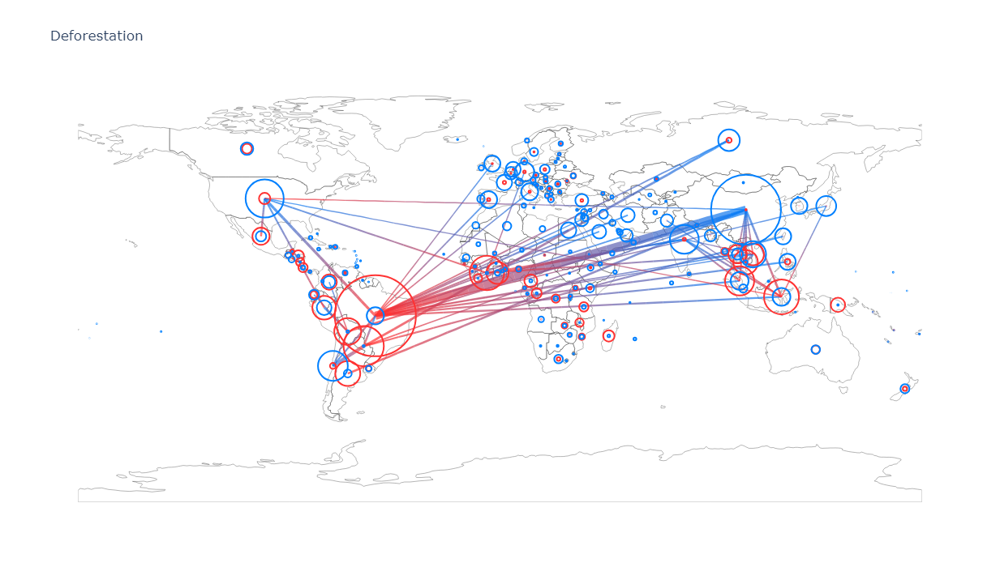

In [18]:
import numpy as np
import plotly.graph_objects as go
import matplotlib.colors as mcolors

# Function to interpolate between two points
def interpolate_points(lon1, lat1, lon2, lat2, num_points=10):
    lons = np.linspace(lon1, lon2, num_points)
    lats = np.linspace(lat1, lat2, num_points)
    return lons, lats

# Create the figure
fig = go.Figure()


num_segments = 25  # Number of segments to divide each line into
colors = [mcolors.to_hex(c) for c in np.linspace(mcolors.to_rgba('#FF3232'), mcolors.to_rgba('#0080ff'), num_segments)]


for i in range(len(Def_trade_Kastner_network)):
    lon1, lat1 = Def_trade_Kastner_network['start_lon'][i], Def_trade_Kastner_network['start_lat'][i]
    lon2, lat2 = Def_trade_Kastner_network['end_lon'][i], Def_trade_Kastner_network['end_lat'][i]
    lons, lats = interpolate_points(lon1, lat1, lon2, lat2, num_points=num_segments)
    
    for j in range(num_segments - 1):
        fig.add_trace(
            go.Scattergeo(
                lon=[lons[j], lons[j + 1]],
                lat=[lats[j], lats[j + 1]],
                mode='lines',
                line=dict(width=Def_trade_Kastner_network['Relative Emissions'][i]**0.5,
                          color=colors[j]),
                opacity = 0.7,
                showlegend=False
            ),
        )

# Add producer country markers
fig.add_trace(go.Scattergeo(
    lon=grouped_producer['start_lon'],
    lat=grouped_producer['start_lat'],
    mode='markers',
    #text = grouped_producer['Deforestation emissions incl. peat drainage (MtCO2)'],
    marker=dict(
        size=grouped_producer['Relative Emissions']**0.5*10,
        #size=grouped_producer['Deforestation emissions incl. peat drainage (MtCO2)']/max_value*1000**0.6,
        color='rgba(0,0,0,0)',  # Transparent fill color
        opacity=1,
        line=dict(width=2, color='#FF3232'),  # Border color
        
    ),
     
    text=grouped_producer['Deforestation risk (ha)'],  # Hover text for insight
    name='Producer country'
))

# Add consumer country markers
fig.add_trace(go.Scattergeo(
    lon=grouped_consumer['start_lon'],
    lat=grouped_consumer['start_lat'],
    mode='markers',
    marker=dict(
        size=grouped_consumer['Relative Emissions']**0.5*10,
        #size=grouped_consumer['Deforestation emissions incl. peat drainage (MtCO2)']/max_value*1000**0.6,
        color='rgba(0,0,0,0)',  # Transparent fill color
        opacity=1,
        line=dict(width=2, color='#0080ff')  # Border color
    ),
    text=grouped_consumer['Deforestation risk (ha)'],  # Hover text for insight
    name='Consumer country'
))


fig.update_layout(
    title_text='Deforestation',
    showlegend=False,
    geo=dict(
        visible=False,
        showcountries=True,
        projection_type='equirectangular',  # You can change this to 'mercator' if needed
        countrywidth = 0.3,
        countrycolor = 'black',
        coastlinewidth = 20,
    ),
)

fig.update_layout(
    autosize=False,
    width=1200,
    height=700,
)

fig.show()
fig.write_image('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Figures/Figure7a.svg')

In [28]:
Def_trade_Kastner = pd.read_excel('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Generated_results/Trade models/DeDuCE_TK (processed).xlsx')

In [29]:
Def_trade_Kastner = Def_trade_Kastner.loc[Def_trade_Kastner['Year'] == 2022]
#Def_trade_Kastner = Def_trade_Kastner.loc[(Def_trade_Kastner['Producer country'] != Def_trade_Kastner['Consumer country'])]
Def_trade_Kastner = Def_trade_Kastner.loc[Def_trade_Kastner['Consumer country'].isin(['Austria', 'Belgium', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland',
                                                                           'France', 'Germany', 'Greece', 'Hungary', 'Ireland', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg',
                                                                           'Malta', 'Netherlands', 'Poland', 'Portugal', 'Romania', 'Slovakia', 'Slovenia', 'Spain', 'Sweden'])]
Def_trade_Kastner = Def_trade_Kastner.groupby(['Producer country', 'Commodity']).sum().reset_index()

/tmp/user/1011/ipykernel_1267941/3430825700.py:6: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



/tmp/user/1011/ipykernel_1267941/3422586501.py:41: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)

/tmp/user/1011/ipykernel_1267941/3422586501.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



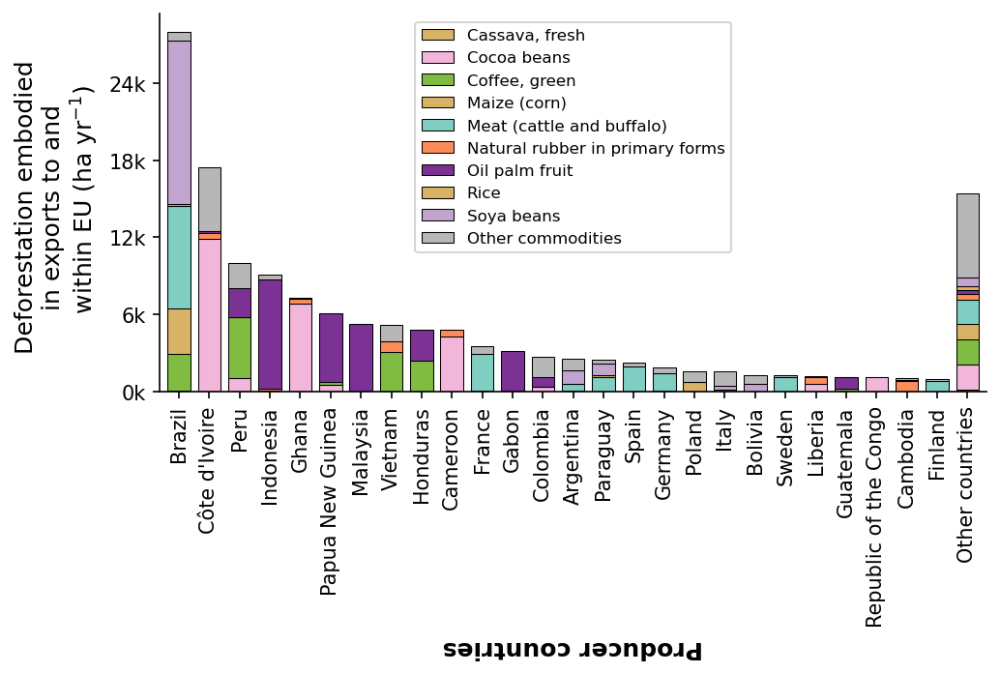

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(7, 7.5), dpi=150)

# Assuming Def_trade_Kastner is your DataFrame
# Specify the commodities to keep
Def_trade_Kastner.loc[Def_trade_Kastner['Producer country'] == 'Democratic Republic of the Congo', 'Producer country'] = 'DR Congo'

commodities_to_keep = ['Meat (cattle and buffalo)', 'Oil palm fruit', 'Cocoa beans', 'Coffee, green',
                       'Natural rubber in primary forms', 'Soya beans', 'Maize (corn)', 'Rice', 'Cassava, fresh']

# Define a color map for the commodities
color_map = {
    'Meat (cattle and buffalo)': '#80cdc1',  # Brown
    'Oil palm fruit': '#7b3294',  # Purple
    'Soya beans': '#c2a5cf',  # Light Purple
    'Cocoa beans': '#f1b6da',  # Maroon
    'Coffee, green': '#7fbc41',  # Pink
    'Natural rubber in primary forms': '#fc8d59',  # Orange
    'Cassava, fresh': '#d8b365',
    'Maize (corn)': '#d8b365',
    'Rice': '#d8b365',
    'Other commodities': '#B7B7B7',  # Grey
}

# Step 1: Aggregate data to get the top 27 producer countries by deforestation
top_producers = Def_trade_Kastner.groupby('Producer country')['Deforestation risk (ha)'].sum().nlargest(26).index
other_producers = Def_trade_Kastner.loc[~Def_trade_Kastner['Producer country'].isin(top_producers), 'Producer country'].unique()

# Step 2: Categorize commodities
Def_trade_Kastner['Commodity'] = Def_trade_Kastner['Commodity'].apply(lambda x: x if x in commodities_to_keep else 'Other commodities')

# Step 3: Determine the top 5 commodities by deforestation for each top producer country
def get_top_commodities(group):
    top_commodities = group.groupby('Commodity')['Deforestation risk (ha)'].sum().nlargest(15).index
    group['Commodity'] = group['Commodity'].apply(lambda x: x if x in top_commodities else 'Other commodities')
    return group

# Apply the function to groupby object and concatenate results
top_data = Def_trade_Kastner.loc[Def_trade_Kastner['Producer country'].isin(top_producers)].groupby('Producer country').apply(get_top_commodities)

# Step 4: Group the rest of the producer countries and commodities
other_data = Def_trade_Kastner.loc[Def_trade_Kastner['Producer country'].isin(other_producers)]
other_data['Producer country'] = 'Other countries'
other_data = other_data.groupby(['Producer country', 'Commodity'])['Deforestation risk (ha)'].sum().reset_index()

# Combine top and other data
combined_data = pd.concat([top_data, other_data])

# Step 5: Prepare the data for plotting
plot_data = combined_data.groupby(['Producer country', 'Commodity'])['Deforestation risk (ha)'].sum().unstack().fillna(0)

# Ensure 'Other commodities' is the last column
cols = [col for col in plot_data.columns if col != 'Other commodities'] + ['Other commodities']
plot_data = plot_data[cols]

# Sort the plot_data by the total deforestation risk in decreasing order, ensuring 'Other countries' is last
plot_data['Total'] = plot_data.sum(axis=1)
plot_data = plot_data.sort_values(by='Total', ascending=False)
plot_data = plot_data.drop(columns='Total')

# Move 'Other countries' row to the end
plot_data = pd.concat([plot_data.loc[plot_data.index != 'Other countries'], plot_data.loc[plot_data.index == 'Other countries']])

# Step 6: Plot the stacked bar plot with custom colors
plot_data.plot(kind='bar', stacked=True, color=[color_map[col] for col in plot_data.columns], ax=axes[0], width=0.75, edgecolor="black", lw=0.5)
def million_formatter(y, pos):
    return '{:.0f}k'.format(y / 10**3)
import matplotlib.ticker as ticker

axes[0].yaxis.set_major_formatter(ticker.FuncFormatter(million_formatter))
axes[0].yaxis.set_major_locator(plt.MaxNLocator(5))
axes[0].set_xlabel('Producer countries', fontsize=12, rotation = 180, weight = 'bold')
axes[0].spines[['right', 'top']].set_visible(False)  # Hide the top and right spines
axes[0].yaxis.set_label_position('left')
axes[0].yaxis.tick_left()
axes[0].set_ylabel('Deforestation embodied \nin exports to and \n within EU (ha yr$^{-1}$)', fontsize=12)
axes[0].margins(x=0.015)
axes[0].tick_params(axis='both', which='major', labelsize=10)
axes[0].tick_params(axis='x', rotation=90)
axes[0].yaxis.set_major_locator(plt.MaxNLocator(5))
axes[0].legend(fontsize=8)
# Remove empty subplots
[fig.delaxes(axes) for axes in axes.flatten() if not axes.has_data()]

plt.tight_layout()
plt.show()

fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Figures/Figure7_b.svg')

In [23]:
plot_data.sum().sum()

143120.0239578457

In [35]:
Def_trade_Kastner = pd.read_excel('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Generated_results/Trade models/DeDuCE_TK (processed).xlsx')

In [25]:
Def_trade_Kastner = Def_trade_Kastner.loc[Def_trade_Kastner['Year'] == 2022]
#Def_trade_Kastner = Def_trade_Kastner.loc[(Def_trade_Kastner['Producer country'] != Def_trade_Kastner['Consumer country'])]
Def_trade_Kastner = Def_trade_Kastner.groupby(['Consumer country', 'Commodity']).sum().reset_index()

/tmp/user/1011/ipykernel_1267941/1919294278.py:3: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [26]:
Def_trade_Kastner = Def_trade_Kastner.loc[Def_trade_Kastner['Consumer country'].isin(['Austria', 'Belgium', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland',
                                                                           'France', 'Germany', 'Greece', 'Hungary', 'Ireland', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg',
                                                                           'Malta', 'Netherlands', 'Poland', 'Portugal', 'Romania', 'Slovakia', 'Slovenia', 'Spain', 'Sweden'])]

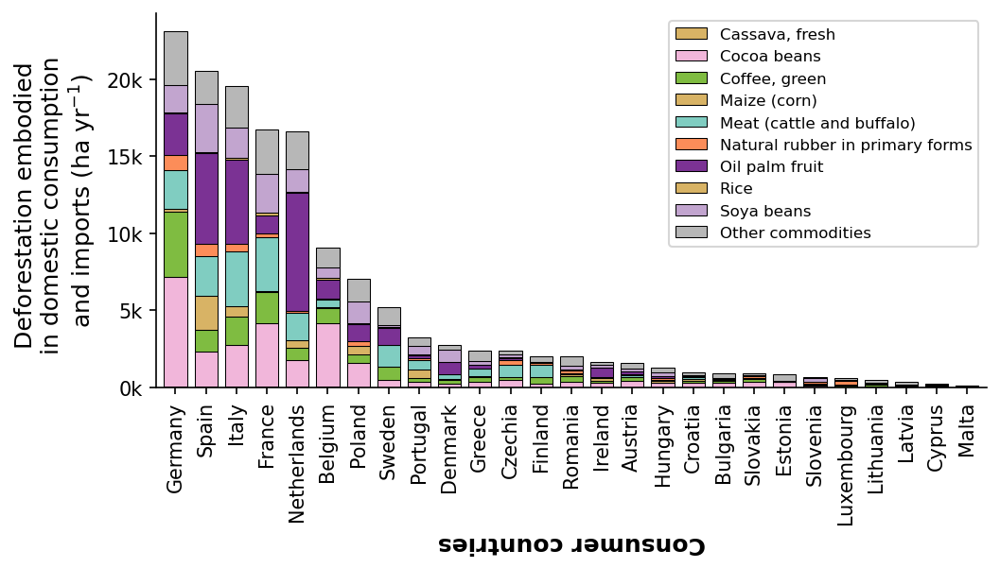

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(7.15, 6.9), dpi=150)

# Assuming Def_trade_Kastner is your DataFrame
# Specify the commodities to keep

commodities_to_keep = [ 'Maize (corn)', 'Rice', 'Cassava, fresh', 'Meat (cattle and buffalo)', 'Oil palm fruit', 'Cocoa beans', 'Coffee, green',
                       'Natural rubber in primary forms', 'Soya beans']


# Step 1: Aggregate data to get the top 27 producer countries by deforestation
top_consumers = Def_trade_Kastner.groupby('Consumer country', group_keys=False)['Deforestation risk (ha)'].sum().nlargest(30).index
other_consumers = Def_trade_Kastner.loc[~Def_trade_Kastner['Consumer country'].isin(top_consumers), 'Consumer country'].unique()

# Step 2: Categorize commodities
Def_trade_Kastner['Commodity'] = Def_trade_Kastner['Commodity'].apply(lambda x: x if x in commodities_to_keep else 'Other commodities')

# Step 3: Determine the top 5 commodities by deforestation for each top producer country
def get_top_commodities(group):
    top_commodities = group.groupby('Commodity', group_keys=False)['Deforestation risk (ha)'].sum().nlargest(15).index
    group['Commodity'] = group['Commodity'].apply(lambda x: x if x in top_commodities else 'Other commodities')
    return group

# Apply the function to groupby object and concatenate results
top_data = Def_trade_Kastner.loc[Def_trade_Kastner['Consumer country'].isin(top_consumers)].groupby('Consumer country', group_keys=False).apply(get_top_commodities)

# Step 4: Group the rest of the producer countries and commodities
other_data = Def_trade_Kastner.loc[Def_trade_Kastner['Consumer country'].isin(other_consumers)]
other_data['Consumer country'] = 'Other countries'
other_data = other_data.groupby(['Consumer country', 'Commodity'], group_keys=False)['Deforestation risk (ha)'].sum().reset_index()

# Combine top and other data
combined_data = pd.concat([top_data, other_data])

# Step 5: Prepare the data for plotting
plot_data = combined_data.groupby(['Consumer country', 'Commodity'], group_keys=False)['Deforestation risk (ha)'].sum().unstack().fillna(0)

# Ensure 'Other commodities' is the last column
cols = [col for col in plot_data.columns if col != 'Other commodities'] + ['Other commodities']
plot_data = plot_data[cols]

# Sort the plot_data by the total deforestation risk in decreasing order, ensuring 'Other countries' is last
plot_data['Total'] = plot_data.sum(axis=1)
plot_data = plot_data.sort_values(by='Total', ascending=False)
plot_data = plot_data.drop(columns='Total')

# Move 'Other countries' row to the end
plot_data = pd.concat([plot_data.loc[plot_data.index != 'Other countries'], plot_data.loc[plot_data.index == 'Other countries']])

# Step 6: Plot the stacked bar plot with custom colors
plot_data.plot(kind='bar', stacked=True, color=[color_map[col] for col in plot_data.columns], ax=axes[0], width=0.75, edgecolor="black", lw=0.5)
def million_formatter(y, pos):
    return '{:.0f}k'.format(y / 10**3)
import matplotlib.ticker as ticker

axes[0].yaxis.set_major_formatter(ticker.FuncFormatter(million_formatter))
axes[0].yaxis.set_major_locator(plt.MaxNLocator(5))
axes[0].set_xlabel('Consumer countries', fontsize=12, rotation = 180, weight = 'bold')
axes[0].spines[['right', 'top']].set_visible(False)  # Hide the top and right spines
axes[0].yaxis.set_label_position('left')
axes[0].yaxis.tick_left()
axes[0].set_ylabel('Deforestation embodied \nin domestic consumption \nand imports (ha yr$^{-1}$)', fontsize=12)
axes[0].margins(x=0.015)
axes[0].tick_params(axis='both', which='major', labelsize=10)
axes[0].tick_params(axis='x', rotation=90)
axes[0].yaxis.set_major_locator(plt.MaxNLocator(5))
axes[0].legend(fontsize=8)
# Remove empty subplots
[fig.delaxes(axes) for axes in axes.flatten() if not axes.has_data()]

plt.tight_layout()
plt.show()

fig.savefig('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Figures/Figure7_c.svg')

In [31]:
plot_data.sum().sum()

143120.0239578457

In [49]:
Def_trade_Kastner.loc[Def_trade_Kastner['Consumption'] == 'Traded', 'Deforestation risk (ha)'].sum()/Def_trade_Kastner['Deforestation risk (ha)'].sum()

0.2731347275517224

In [65]:
Def_trade_Kastner = pd.read_excel('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Generated_results/Trade models/DeDuCE_TK (processed).xlsx')

In [66]:
Def_trade_Kastner.loc[(Def_trade_Kastner['Year'] == 2022) & (Def_trade_Kastner['Consumption'] == 'Traded'), 'Deforestation risk (ha)'].sum()

1039904.1834601234

In [63]:
Def_trade_Kastner = Def_trade_Kastner.loc[Def_trade_Kastner['Year'] == 2022]
#Def_trade_Kastner = Def_trade_Kastner.loc[(Def_trade_Kastner['Producer country'] != Def_trade_Kastner['Consumer country'])]
Def_trade_Kastner = Def_trade_Kastner.groupby(['Consumer country', 'Commodity']).sum().reset_index()

/tmp/user/1011/ipykernel_1267941/1919294278.py:3: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [58]:
Def_trade_Kastner = Def_trade_Kastner.loc[Def_trade_Kastner['Consumer country'].isin(['Austria', 'Belgium', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland',
                                                                           'France', 'Germany', 'Greece', 'Hungary', 'Ireland', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg',
                                                                           'Malta', 'Netherlands', 'Poland', 'Portugal', 'Romania', 'Slovakia', 'Slovenia', 'Spain', 'Sweden'])]

In [60]:
Def_trade_Kastner['Deforestation risk (ha)'].sum()

143120.02395784573

In [67]:
143120.02395784573/1039904.1834601234

0.13762808750478872

In [50]:
Def_trade_Kastner = pd.read_excel('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Generated_results/Trade models/DeDuCE_TK (processed).xlsx')

In [51]:
Def_trade_Kastner = Def_trade_Kastner.loc[Def_trade_Kastner['Year'] == 2022]
Def_trade_Kastner = Def_trade_Kastner.loc[(Def_trade_Kastner['Producer country'] != Def_trade_Kastner['Consumer country'])]
Def_trade_Kastner = Def_trade_Kastner.groupby(['Producer country', 'Commodity']).sum().reset_index()

/tmp/user/1011/ipykernel_1267941/3764904783.py:3: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



/tmp/user/1011/ipykernel_1267941/3634247286.py:41: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)

/tmp/user/1011/ipykernel_1267941/3634247286.py:45: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



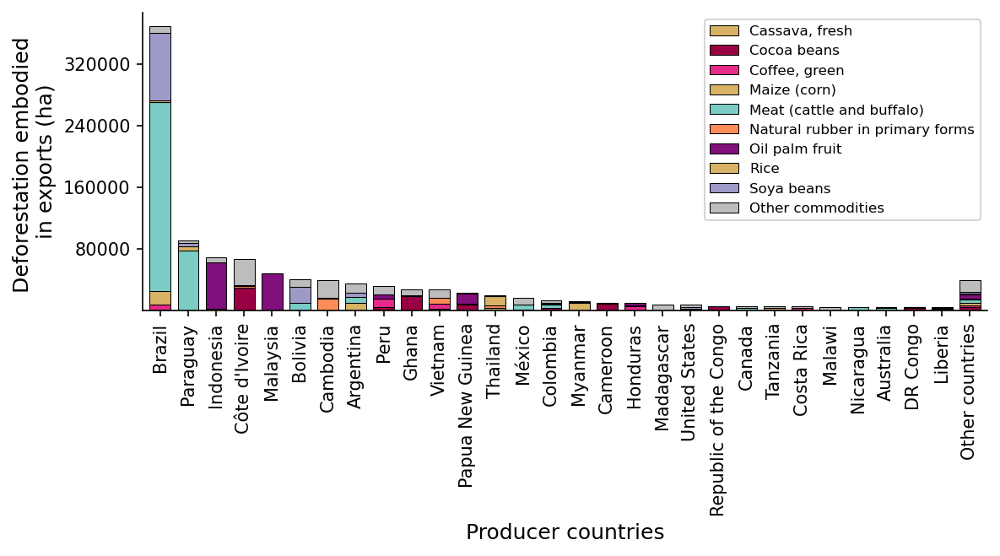

In [52]:
import pandas as pd
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(8, 7), dpi=150)

# Assuming Def_trade_Kastner is your DataFrame
# Specify the commodities to keep
Def_trade_Kastner.loc[Def_trade_Kastner['Producer country'] == 'Democratic Republic of the Congo', 'Producer country'] = 'DR Congo'

commodities_to_keep = ['Meat (cattle and buffalo)', 'Oil palm fruit', 'Cocoa beans', 'Coffee, green',
                       'Natural rubber in primary forms', 'Soya beans', 'Maize (corn)', 'Rice', 'Cassava, fresh']

# Define a color map for the commodities
color_map = {
    'Meat (cattle and buffalo)': '#7bccc4',  # Brown
    'Oil palm fruit': '#810f7c',  # Purple
    'Cocoa beans': '#980043',  # Maroon
    'Coffee, green': '#e7298a',  # Pink
    'Natural rubber in primary forms': '#fc8d59',  # Orange
    'Soya beans': '#9e9ac8',  # Light Purple
    'Other commodities': '#bdbdbd',  # Grey
    'Cassava, fresh': '#d8b365',
    'Maize (corn)': '#d8b365',
    'Rice': '#d8b365'
}

# Step 1: Aggregate data to get the top 27 producer countries by deforestation
top_producers = Def_trade_Kastner.groupby('Producer country')['Deforestation risk (ha)'].sum().nlargest(29).index
other_producers = Def_trade_Kastner.loc[~Def_trade_Kastner['Producer country'].isin(top_producers), 'Producer country'].unique()

# Step 2: Categorize commodities
Def_trade_Kastner['Commodity'] = Def_trade_Kastner['Commodity'].apply(lambda x: x if x in commodities_to_keep else 'Other commodities')

# Step 3: Determine the top 5 commodities by deforestation for each top producer country
def get_top_commodities(group):
    top_commodities = group.groupby('Commodity')['Deforestation risk (ha)'].sum().nlargest(15).index
    group['Commodity'] = group['Commodity'].apply(lambda x: x if x in top_commodities else 'Other commodities')
    return group

# Apply the function to groupby object and concatenate results
top_data = Def_trade_Kastner.loc[Def_trade_Kastner['Producer country'].isin(top_producers)].groupby('Producer country').apply(get_top_commodities)

# Step 4: Group the rest of the producer countries and commodities
other_data = Def_trade_Kastner.loc[Def_trade_Kastner['Producer country'].isin(other_producers)]
other_data['Producer country'] = 'Other countries'
other_data = other_data.groupby(['Producer country', 'Commodity'])['Deforestation risk (ha)'].sum().reset_index()

# Combine top and other data
combined_data = pd.concat([top_data, other_data])

# Step 5: Prepare the data for plotting
plot_data = combined_data.groupby(['Producer country', 'Commodity'])['Deforestation risk (ha)'].sum().unstack().fillna(0)

# Ensure 'Other commodities' is the last column
cols = [col for col in plot_data.columns if col != 'Other commodities'] + ['Other commodities']
plot_data = plot_data[cols]

# Sort the plot_data by the total deforestation risk in decreasing order, ensuring 'Other countries' is last
plot_data['Total'] = plot_data.sum(axis=1)
plot_data = plot_data.sort_values(by='Total', ascending=False)
plot_data = plot_data.drop(columns='Total')

# Move 'Other countries' row to the end
plot_data = pd.concat([plot_data.loc[plot_data.index != 'Other countries'], plot_data.loc[plot_data.index == 'Other countries']])

# Step 6: Plot the stacked bar plot with custom colors
plot_data.plot(kind='bar', stacked=True, color=[color_map[col] for col in plot_data.columns], ax=axes[0], width=0.75, edgecolor="black", lw=0.5)

axes[0].set_xlabel('Producer countries', fontsize=12)
axes[0].spines[['right', 'top']].set_visible(False)  # Hide the top and right spines
axes[0].yaxis.set_label_position('left')
axes[0].yaxis.tick_left()
axes[0].set_ylabel('Deforestation embodied \nin exports (ha)', fontsize=12)
axes[0].margins(x=0.015)
axes[0].tick_params(axis='both', which='major', labelsize=10)
axes[0].tick_params(axis='x', rotation=90)
axes[0].yaxis.set_major_locator(plt.MaxNLocator(5))
axes[0].legend(fontsize=8)
# Remove empty subplots
[fig.delaxes(axes) for axes in axes.flatten() if not axes.has_data()]

plt.tight_layout()
plt.show()


In [53]:
Def_trade_Kastner = pd.read_excel('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Generated_results/Trade models/DeDuCE_TK (processed).xlsx')

In [54]:
Def_trade_Kastner = Def_trade_Kastner.loc[Def_trade_Kastner['Year'] == 2022]
Def_trade_Kastner = Def_trade_Kastner.loc[(Def_trade_Kastner['Producer country'] != Def_trade_Kastner['Consumer country'])]
Def_trade_Kastner = Def_trade_Kastner.groupby(['Consumer country', 'Commodity']).sum().reset_index()

/tmp/user/1011/ipykernel_1267941/2850198845.py:3: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



/tmp/user/1011/ipykernel_1267941/1826208164.py:44: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



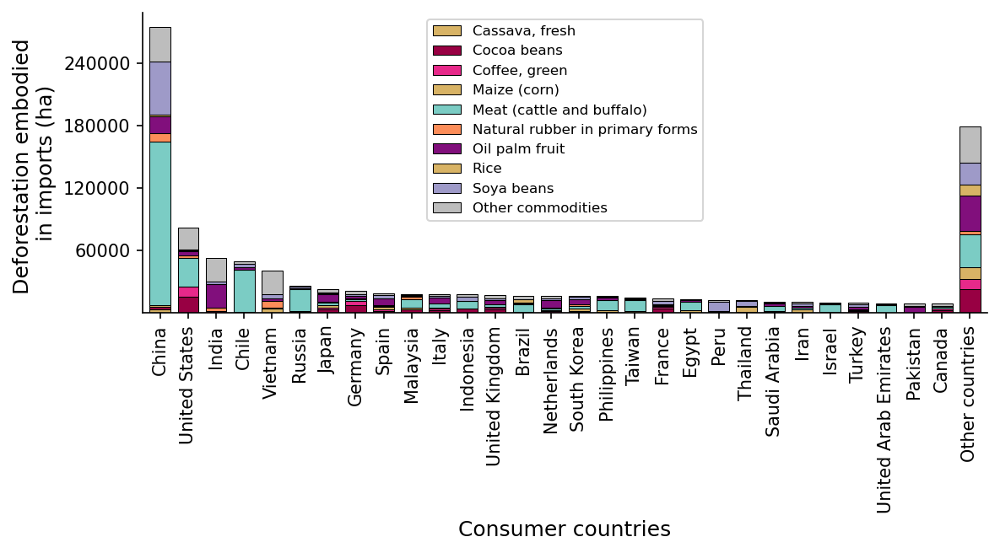

In [55]:
import pandas as pd
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(8, 7), dpi=150)

# Assuming Def_trade_Kastner is your DataFrame
# Specify the commodities to keep

commodities_to_keep = [ 'Maize (corn)', 'Rice', 'Cassava, fresh', 'Meat (cattle and buffalo)', 'Oil palm fruit', 'Cocoa beans', 'Coffee, green',
                       'Natural rubber in primary forms', 'Soya beans']

# Define a color map for the commodities
color_map = {
    'Meat (cattle and buffalo)': '#7bccc4',  # Brown
    'Oil palm fruit': '#810f7c',  # Purple
    'Cocoa beans': '#980043',  # Maroon
    'Coffee, green': '#e7298a',  # Pink
    'Natural rubber in primary forms': '#fc8d59',  # Orange
    'Soya beans': '#9e9ac8',  # Light Purple
    'Other commodities': '#bdbdbd',  # Grey
    'Cassava, fresh': '#d8b365',
    'Maize (corn)': '#d8b365',
    'Rice': '#d8b365'
}

# Step 1: Aggregate data to get the top 27 producer countries by deforestation
top_consumers = Def_trade_Kastner.groupby('Consumer country', group_keys=False)['Deforestation risk (ha)'].sum().nlargest(29).index
other_consumers = Def_trade_Kastner.loc[~Def_trade_Kastner['Consumer country'].isin(top_consumers), 'Consumer country'].unique()

# Step 2: Categorize commodities
Def_trade_Kastner['Commodity'] = Def_trade_Kastner['Commodity'].apply(lambda x: x if x in commodities_to_keep else 'Other commodities')

# Step 3: Determine the top 5 commodities by deforestation for each top producer country
def get_top_commodities(group):
    top_commodities = group.groupby('Commodity', group_keys=False)['Deforestation risk (ha)'].sum().nlargest(15).index
    group['Commodity'] = group['Commodity'].apply(lambda x: x if x in top_commodities else 'Other commodities')
    return group

# Apply the function to groupby object and concatenate results
top_data = Def_trade_Kastner.loc[Def_trade_Kastner['Consumer country'].isin(top_consumers)].groupby('Consumer country', group_keys=False).apply(get_top_commodities)

# Step 4: Group the rest of the producer countries and commodities
other_data = Def_trade_Kastner.loc[Def_trade_Kastner['Consumer country'].isin(other_consumers)]
other_data['Consumer country'] = 'Other countries'
other_data = other_data.groupby(['Consumer country', 'Commodity'], group_keys=False)['Deforestation risk (ha)'].sum().reset_index()

# Combine top and other data
combined_data = pd.concat([top_data, other_data])

# Step 5: Prepare the data for plotting
plot_data = combined_data.groupby(['Consumer country', 'Commodity'], group_keys=False)['Deforestation risk (ha)'].sum().unstack().fillna(0)

# Ensure 'Other commodities' is the last column
cols = [col for col in plot_data.columns if col != 'Other commodities'] + ['Other commodities']
plot_data = plot_data[cols]

# Sort the plot_data by the total deforestation risk in decreasing order, ensuring 'Other countries' is last
plot_data['Total'] = plot_data.sum(axis=1)
plot_data = plot_data.sort_values(by='Total', ascending=False)
plot_data = plot_data.drop(columns='Total')

# Move 'Other countries' row to the end
plot_data = pd.concat([plot_data.loc[plot_data.index != 'Other countries'], plot_data.loc[plot_data.index == 'Other countries']])

# Step 6: Plot the stacked bar plot with custom colors
plot_data.plot(kind='bar', stacked=True, color=[color_map[col] for col in plot_data.columns], ax=axes[0], width=0.75, edgecolor="black", lw=0.5)

axes[0].set_xlabel('Consumer countries', fontsize=12)
axes[0].spines[['right', 'top']].set_visible(False)  # Hide the top and right spines
axes[0].yaxis.set_label_position('left')
axes[0].yaxis.tick_left()
axes[0].set_ylabel('Deforestation embodied \nin imports (ha)', fontsize=12)
axes[0].margins(x=0.015)
axes[0].tick_params(axis='both', which='major', labelsize=10)
axes[0].tick_params(axis='x', rotation=90)
axes[0].yaxis.set_major_locator(plt.MaxNLocator(5))
axes[0].legend(fontsize=8)
# Remove empty subplots
[fig.delaxes(axes) for axes in axes.flatten() if not axes.has_data()]

plt.tight_layout()
plt.show()


In [ ]:
Def_trade_Kastner = pd.read_excel('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Singh et al 2024 - Commodity-driven deforestation, carbon emissions & trade 2001-2022.xlsx', 'Trade flows-physical')

In [459]:
Def_trade_Kastner = Def_trade_Kastner.loc[Def_trade_Kastner['Year'] >= 2022]
Def_trade_Kastner = Def_trade_Kastner.groupby(['Producer country', 'Commodity', 'Consumer country']).sum().reset_index()

In [460]:
Def_trade_Kastner = Def_trade_Kastner.loc[(Def_trade_Kastner['Producer country'] != Def_trade_Kastner['Consumer country'])]

In [461]:
Def_trade_Kastner = Def_trade_Kastner.reset_index(drop=True)

In [65]:
Def_trade_Kastner.loc[Def_trade_Kastner['Producer country'] == 'Brazil'].sort_values('Deforestation emissions incl. peat drainage (MtCO2)')

KeyError: 'Producer country'

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming Def_trade_Kastner is a DataFrame already loaded
Countries = ['Brazil', 'Indonesia', 'Côte d\'Ivoire']

# Create a figure and a grid of subplots
fig, axes = plt.subplots(ncols=len(Countries), nrows=1, figsize=(15, 6))

# Ensure axes is iterable even if there's only one subplot
if len(Countries) == 1:
    axes = [axes]

for ax, Producer in zip(axes, Countries):
    # Filter the DataFrame for the specific producer country
    df = Def_trade_Kastner.loc[(Def_trade_Kastner['Producer country'] == Producer)]
    
    # Group by 'Commodity' and 'Consumer country' and sum up the 'Deforestation risk (ha)'
    grouped = df.groupby(['Commodity', 'Consumer country']).sum(numeric_only=True).reset_index()
    
    # Sort by 'Deforestation risk (ha)' in descending order and get top 9
    top_9 = grouped.sort_values(by='Deforestation risk (ha)', ascending=False).head(9)
    
    # Calculate the sum of the rest commodities
    rest = grouped.sort_values(by='Deforestation risk (ha)', ascending=False).iloc[9:]
    other = rest.sum(numeric_only=True)
    other['Commodity'] = 'Other commodities'
    other['Consumer country'] = 'Multiple countries'
    
    # Append the 'Other' row to the top 9
    top_10 = top_9.append(other, ignore_index=True)
    
    # Bar plot for each commodity and consumer country pair
    x_labels = []
    for i, row in top_10.iterrows():
        if row['Commodity'] == 'Meat (cattle and buffalo)':
            row['Commodity'] = 'Cattle meat'
        if row['Commodity'] == 'Natural rubber in primary forms':
            row['Commodity'] = 'Rubber'
        if row['Commodity'] == 'Oil palm fruit':
            row['Commodity'] = 'Oil palm'
        if row['Commodity'] == 'Cashew nuts, in shell':
            row['Commodity'] = 'Cashew nuts'
        if row['Commodity'] == 'Seed cotton, unginned':
            row['Commodity'] = 'Seed cotton'
        
        ax.bar(f"{Producer} → {row['Consumer country']}\n[{row['Commodity']}]", row['Deforestation risk (ha)']/1000, color='#ff9999', width=0.7)
        ax.set_title(rf'$\bf{{{Producer}}}$ to Consumer countries')
    
    # Adding title and labels
    ax.set_ylabel('Deforestation (kha)', fontsize=14)
    ax.tick_params(axis='x', rotation=90)
    ax.tick_params(axis='y', labelsize=12)
    ax.spines[['right', 'top']].set_visible(False)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)


plt.tight_layout()
plt.show()


In [ ]:
Def_trade_Kastner.loc[Def_trade_Kastner['Producer country'] == 'Brazil'].sum()

/tmp/user/1011/ipykernel_465476/3786702909.py:31: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/user/1011/ipykernel_465476/3786702909.py:31: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/user/1011/ipykernel_465476/3786702909.py:31: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



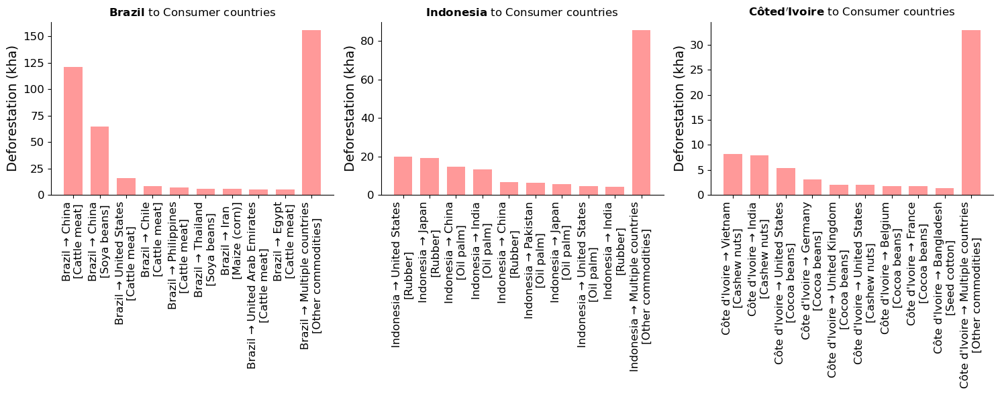

In [335]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming Def_trade_Kastner is a DataFrame already loaded
Countries = ['Brazil', 'Indonesia', 'Côte d\'Ivoire']

# Create a figure and a grid of subplots
fig, axes = plt.subplots(ncols=len(Countries), nrows=1, figsize=(15, 6))

# Ensure axes is iterable even if there's only one subplot
if len(Countries) == 1:
    axes = [axes]

for ax, Producer in zip(axes, Countries):
    # Filter the DataFrame for the specific producer country
    df = Def_trade_Kastner.loc[Def_trade_Kastner['Producer country'] == Producer]
    
    # Group by 'Commodity' and 'Consumer country' and sum up the 'Deforestation risk (ha)'
    grouped = df.groupby(['Commodity', 'Consumer country']).sum(numeric_only=True).reset_index()
    
    # Sort by 'Deforestation risk (ha)' in descending order and get top 9
    top_9 = grouped.sort_values(by='Deforestation risk (ha)', ascending=False).head(9)
    
    # Calculate the sum of the rest commodities
    rest = grouped.sort_values(by='Deforestation risk (ha)', ascending=False).iloc[9:]
    other = rest.sum(numeric_only=True)
    other['Commodity'] = 'Other commodities'
    other['Consumer country'] = 'Multiple countries'
    
    # Append the 'Other' row to the top 9
    top_10 = top_9.append(other, ignore_index=True)
    
    # Bar plot for each commodity and consumer country pair
    x_labels = []
    for i, row in top_10.iterrows():
        if row['Commodity'] == 'Meat (cattle and buffalo)':
            row['Commodity'] = 'Cattle meat'
        if row['Commodity'] == 'Natural rubber in primary forms':
            row['Commodity'] = 'Rubber'
        if row['Commodity'] == 'Oil palm fruit':
            row['Commodity'] = 'Oil palm'
        if row['Commodity'] == 'Cashew nuts, in shell':
            row['Commodity'] = 'Cashew nuts'
        if row['Commodity'] == 'Seed cotton, unginned':
            row['Commodity'] = 'Seed cotton'
        
        ax.bar(f"{Producer} → {row['Consumer country']}\n[{row['Commodity']}]", row['Deforestation risk (ha)']/1000, color='#ff9999', width=0.7)
        ax.set_title(rf'$\bf{{{Producer}}}$ to Consumer countries')
    
    # Adding title and labels
    ax.set_ylabel('Deforestation (kha)', fontsize=14)
    ax.tick_params(axis='x', rotation=90)
    ax.tick_params(axis='y', labelsize=12)
    ax.spines[['right', 'top']].set_visible(False)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)


plt.tight_layout()
plt.show()


/tmp/user/1011/ipykernel_465476/380049871.py:31: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/user/1011/ipykernel_465476/380049871.py:31: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/user/1011/ipykernel_465476/380049871.py:31: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



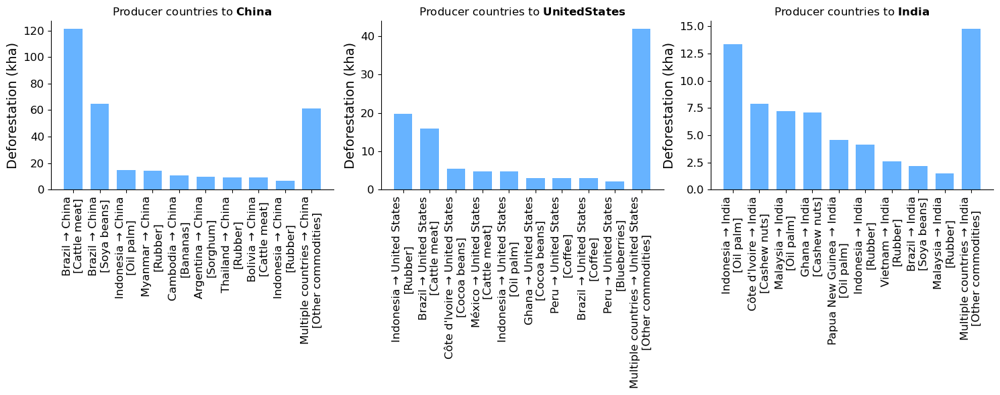

In [336]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming Def_trade_Kastner is a DataFrame already loaded
Countries = ['China', 'United States', 'India']

# Create a figure and a grid of subplots
fig, axes = plt.subplots(ncols=len(Countries), nrows=1, figsize=(15, 6))

# Ensure axes is iterable even if there's only one subplot
if len(Countries) == 1:
    axes = [axes]
    
for ax, Consumer in zip(axes, Countries):
    # Filter the DataFrame for the specific producer country, e.g., Brazil
    df = Def_trade_Kastner.loc[Def_trade_Kastner['Consumer country'] == Consumer]
    
    # Group by 'Commodity' and 'Consumer country' and sum up the 'Deforestation risk (ha)'
    grouped = df.groupby(['Commodity', 'Producer country']).sum(numeric_only=True).reset_index()
    
    # Sort by 'Deforestation risk (ha)' in descending order and get top 9
    top_9 = grouped.sort_values(by='Deforestation risk (ha)', ascending=False).head(9)
    
    # Calculate the sum of the rest commodities
    rest = grouped.sort_values(by='Deforestation risk (ha)', ascending=False).iloc[9:]
    other = rest.sum(numeric_only=True)
    other['Commodity'] = 'Other commodities'
    other['Producer country'] = 'Multiple countries'
    
    # Append the 'Other' row to the top 9
    top_10 = top_9.append(other, ignore_index=True)
        
    # Bar plot for each commodity and consumer country pair
    x_labels = []
    for i, row in top_10.iterrows():
        if row['Commodity'] == 'Meat (cattle and buffalo)':
            row['Commodity'] = 'Cattle meat'
        if row['Commodity'] == 'Natural rubber in primary forms':
            row['Commodity'] = 'Rubber'
        if row['Commodity'] == 'Oil palm fruit':
            row['Commodity'] = 'Oil palm'
        if row['Commodity'] == 'Cashew nuts, in shell':
            row['Commodity'] = 'Cashew nuts'
        if row['Commodity'] == 'Seed cotton, unginned':
            row['Commodity'] = 'Seed cotton'
        if row['Commodity'] == 'Coffee, green':
            row['Commodity'] = 'Coffee'
         
        
        ax.bar(f"{row['Producer country']} → {Consumer}\n[{row['Commodity']}]", row['Deforestation risk (ha)']/1000, color='#67b3ff', width=0.7)
        ax.set_title(rf'Producer countries to $\bf{{{Consumer}}}$')
    
    ax.set_ylabel('Deforestation (kha)', fontsize=14)
    ax.tick_params(axis='x', rotation=90)
    ax.tick_params(axis='y', labelsize=12)
    ax.spines[['right', 'top']].set_visible(False)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

plt.tight_layout()
plt.show()


/tmp/user/1011/ipykernel_465476/3722785084.py:31: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



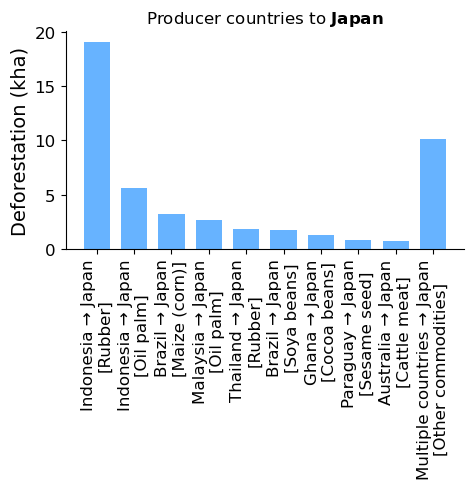

In [339]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming Def_trade_Kastner is a DataFrame already loaded
Countries = ['Japan']

# Create a figure and a grid of subplots
fig, axes = plt.subplots(ncols=len(Countries), nrows=1, figsize=(5, 5))

# Ensure axes is iterable even if there's only one subplot
if len(Countries) == 1:
    axes = [axes]
    
for ax, Consumer in zip(axes, Countries):
    # Filter the DataFrame for the specific producer country, e.g., Brazil
    df = Def_trade_Kastner.loc[Def_trade_Kastner['Consumer country'] == Consumer]
    
    # Group by 'Commodity' and 'Consumer country' and sum up the 'Deforestation risk (ha)'
    grouped = df.groupby(['Commodity', 'Producer country']).sum(numeric_only=True).reset_index()
    
    # Sort by 'Deforestation risk (ha)' in descending order and get top 9
    top_9 = grouped.sort_values(by='Deforestation risk (ha)', ascending=False).head(9)
    
    # Calculate the sum of the rest commodities
    rest = grouped.sort_values(by='Deforestation risk (ha)', ascending=False).iloc[9:]
    other = rest.sum(numeric_only=True)
    other['Commodity'] = 'Other commodities'
    other['Producer country'] = 'Multiple countries'
    
    # Append the 'Other' row to the top 9
    top_10 = top_9.append(other, ignore_index=True)
        
    # Bar plot for each commodity and consumer country pair
    x_labels = []
    for i, row in top_10.iterrows():
        if row['Commodity'] == 'Meat (cattle and buffalo)':
            row['Commodity'] = 'Cattle meat'
        if row['Commodity'] == 'Natural rubber in primary forms':
            row['Commodity'] = 'Rubber'
        if row['Commodity'] == 'Oil palm fruit':
            row['Commodity'] = 'Oil palm'
        if row['Commodity'] == 'Cashew nuts, in shell':
            row['Commodity'] = 'Cashew nuts'
        if row['Commodity'] == 'Seed cotton, unginned':
            row['Commodity'] = 'Seed cotton'
        if row['Commodity'] == 'Coffee, green':
            row['Commodity'] = 'Coffee'
         
        
        ax.bar(f"{row['Producer country']} → {Consumer}\n[{row['Commodity']}]", row['Deforestation risk (ha)']/1000, color='#67b3ff', width=0.7)
        ax.set_title(rf'Producer countries to $\bf{{{Consumer}}}$')
    
    ax.set_ylabel('Deforestation (kha)', fontsize=14)
    ax.tick_params(axis='x', rotation=90)
    ax.tick_params(axis='y', labelsize=12)
    ax.spines[['right', 'top']].set_visible(False)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

plt.tight_layout()
plt.show()


In [365]:
grouped

,Commodity,Producer country,Year,Deforestation risk (ha),Deforestation emissions incl. peat drainage (MtCO2)
0,"Almonds, in shell",Portugal,2022,5.142737,0.000942
1,"Almonds, in shell",Spain,6066,9.236072,0.002022
2,"Almonds, in shell",United States,10110,25.733214,0.009938
3,"Anise, badian, coriander, cumin, caraway, fenn...",Russia,2022,1.245001,0.000398
4,"Anise, badian, coriander, cumin, caraway, fenn...",Vietnam,20220,62.144490,0.042842
...,...,...,...,...,...
476,Wheat,Spain,2022,2.833624,0.000946
477,Wheat,Sweden,6066,5.102864,0.003020
478,Wheat,Ukraine,20220,75.829836,0.034544
479,Wheat,United Kingdom,14154,28.740143,0.014222


/tmp/user/1011/ipykernel_465476/1696619122.py:33: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



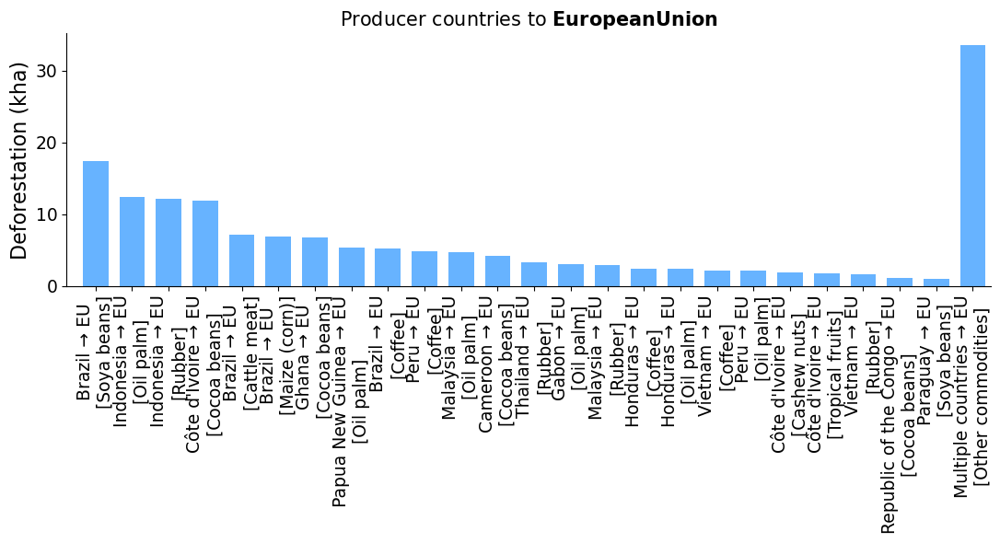

In [402]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming Def_trade_Kastner is a DataFrame already loaded
Countries = ['European Union']

# Create a figure and a grid of subplots
fig, axes = plt.subplots(ncols=len(Countries), nrows=1, figsize=(11, 6))

# Ensure axes is iterable even if there's only one subplot
if len(Countries) == 1:
    axes = [axes]
    
for ax, Consumer in zip(axes, Countries):
    # Filter the DataFrame for the specific producer country, e.g., Brazil
    df = Def_trade_Kastner.loc[Def_trade_Kastner['Consumer country'].isin(['Austria', 'Belgium', 'Bulgaria', 'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland',
                                                                           'France', 'Germany', 'Greece', 'Hungary', 'Ireland', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg',
                                                                           'Malta', 'Netherlands', 'Poland', 'Portugal', 'Romania', 'Slovakia', 'Slovenia', 'Spain', 'Sweden'])]
    
    # Group by 'Commodity' and 'Consumer country' and sum up the 'Deforestation risk (ha)'
    grouped = df.groupby(['Commodity', 'Producer country']).sum(numeric_only=True).reset_index()
    
    # Sort by 'Deforestation risk (ha)' in descending order and get top 9
    top_9 = grouped.sort_values(by='Deforestation risk (ha)', ascending=False).head(24)
    
    # Calculate the sum of the rest commodities
    rest = grouped.sort_values(by='Deforestation risk (ha)', ascending=False).iloc[24:]
    other = rest.sum(numeric_only=True)
    other['Commodity'] = 'Other commodities'
    other['Producer country'] = 'Multiple countries'
    
    # Append the 'Other' row to the top 9
    top_10 = top_9.append(other, ignore_index=True)
        
    # Bar plot for each commodity and consumer country pair
    x_labels = []
    for i, row in top_10.iterrows():
        if row['Commodity'] == 'Meat (cattle and buffalo)':
            row['Commodity'] = 'Cattle meat'
        if row['Commodity'] == 'Natural rubber in primary forms':
            row['Commodity'] = 'Rubber'
        if row['Commodity'] == 'Oil palm fruit':
            row['Commodity'] = 'Oil palm'
        if row['Commodity'] == 'Cashew nuts, in shell':
            row['Commodity'] = 'Cashew nuts'
        if row['Commodity'] == 'Seed cotton, unginned':
            row['Commodity'] = 'Seed cotton'
        if row['Commodity'] == 'Coffee, green':
            row['Commodity'] = 'Coffee'
        if row['Commodity'] == 'Mangoes, guavas and mangosteens':
            row['Commodity'] = 'Tropical fruits'
         
        
        ax.bar(f"{row['Producer country']} → EU\n[{row['Commodity']}]", row['Deforestation risk (ha)']/1000, color='#67b3ff', width=0.7)
        ax.set_title(rf'Producer countries to $\bf{{{Consumer}}}$', fontsize = 15)
    
    ax.set_ylabel('Deforestation (kha)', fontsize=16)
    ax.tick_params(axis='x', rotation=90, labelsize=13.5)
    ax.tick_params(axis='y', labelsize=13.5)
    ax.spines[['right', 'top']].set_visible(False)

plt.xlim(-0.8,24.5)
plt.tight_layout()
plt.show()


In [369]:
top_10

,Commodity,Producer country,Year,Deforestation risk (ha),Deforestation emissions incl. peat drainage (MtCO2)
0,Soya beans,Brazil,52572.0,17393.160873,4.666749
1,Oil palm fruit,Indonesia,46506.0,12435.198963,11.073044
2,Natural rubber in primary forms,Indonesia,48528.0,12167.110373,6.143816
3,Cocoa beans,Côte d'Ivoire,52572.0,11862.628020,3.212587
4,Meat (cattle and buffalo),Brazil,52572.0,7206.915305,4.618652
5,Maize (corn),Brazil,26286.0,6888.224235,4.285927
6,Cocoa beans,Ghana,52572.0,6805.174563,2.016627
7,Oil palm fruit,Papua New Guinea,42462.0,5323.223031,-0.999628
8,"Coffee, green",Brazil,54594.0,5185.491679,1.558997
9,"Coffee, green",Peru,54594.0,4810.684912,4.447588


In [498]:
Def_att = pd.read_excel('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Generated_results/DeDuCE_Deforestation_attribution_v1.0.1 (2001-2022).xlsx', 'Deforestation attribution')

In [499]:
Def_att = Def_att.loc[Def_att['Year'] == 2022]
Def_att = Def_att.groupby(['Producer country', 'Commodity']).sum().reset_index()

/tmp/user/1011/ipykernel_465476/534909142.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [520]:
Def_att.loc[(Def_att['Commodity'] == 'Cassava, fresh') & (Def_att['Producer country'] == 'Democratic Republic of Congo')]#.sum()

,Producer country,Commodity,Year,"Deforestation attribution, unamortized (ha)","Deforestation risk, amortized (ha)","Deforestation emissions excl. peat drainage, unamortized (MtCO2)","Deforestation emissions excl. peat drainage, amortized (MtCO2)",Peatland drainage emissions (MtCO2),"Deforestation emissions incl. peat drainage, amortized (MtCO2)",Quality Index


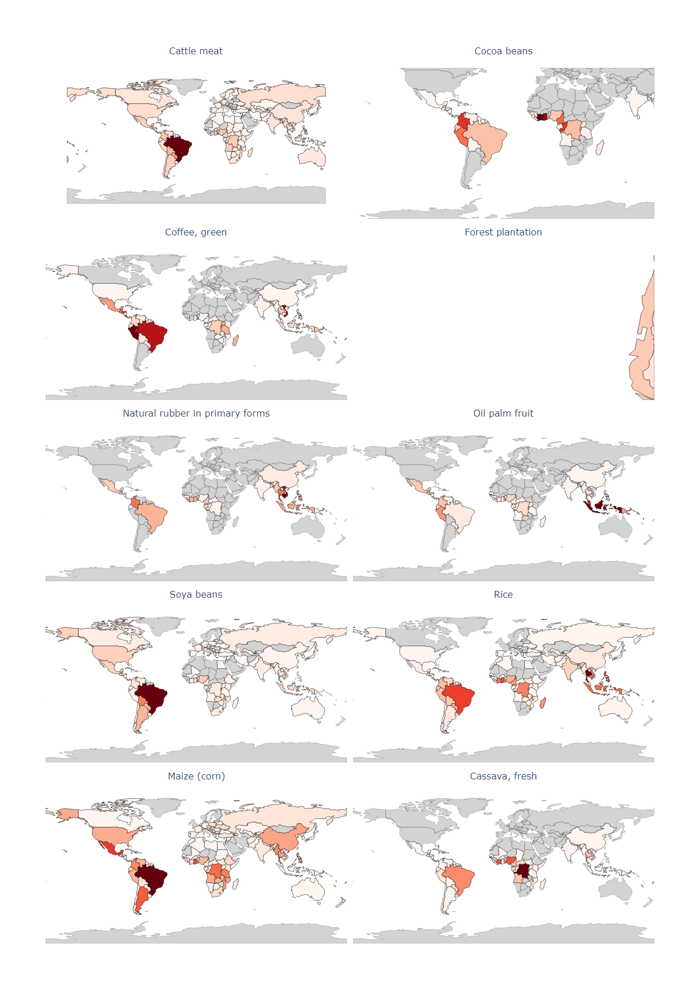

In [488]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# Example setup
# Def_att = pd.read_csv('path_to_your_data.csv')  # Load your data here

commodities = ['Cattle meat', 'Cocoa beans', 'Coffee, green', 'Forest plantation', 'Natural rubber in primary forms', 
               'Oil palm fruit', 'Soya beans', 'Rice', 'Maize (corn)', 'Cassava, fresh']

# Calculate the number of rows needed (two plots per row)
num_cols = 2
num_rows = (len(commodities) + 1) // num_cols

# Create subplots with reduced space
fig = make_subplots(
    rows=num_rows, 
    cols=num_cols,
    subplot_titles=commodities,
    specs=[[{'type': 'choropleth'} for _ in range(num_cols)] for _ in range(num_rows)],
    horizontal_spacing=0.01,  # Reduce horizontal space
    vertical_spacing=0.01,     # Reduce vertical space
)

# Load country lookup codes
Country_lookup_codes = pd.read_excel('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Supplementary_data-DeDuCE v1.xlsx', 'Lookup-Country (GADM)')

# Add each plot to the corresponding subplot
for i, commodity in enumerate(commodities):
    row = (i // num_cols) + 1
    col = (i % num_cols) + 1
    
    if commodity == 'Forest plantation':
        grouped_producer_deforestation = Def_att.loc[Def_att['Commodity'].str.startswith('Forest plantation')]
    else:
        grouped_producer_deforestation = Def_att.loc[Def_att['Commodity'] == commodity]
    grouped_producer_deforestation = grouped_producer_deforestation.loc[grouped_producer_deforestation['Deforestation risk, amortized (ha)'] != 0]
    grouped_producer_deforestation = grouped_producer_deforestation[['Producer country', 'Deforestation risk, amortized (ha)']].groupby(['Producer country']).sum(numeric_only=True).reset_index()
    grouped_producer_deforestation['ISO'] = grouped_producer_deforestation['Producer country'].map(Country_lookup_codes.set_index('COUNTRY')['GID_0'])
    
    trace = go.Choropleth(
        locations=grouped_producer_deforestation['ISO'],
        z=grouped_producer_deforestation['Deforestation risk, amortized (ha)']**0.5,
        text=grouped_producer_deforestation['Deforestation risk, amortized (ha)'],
        colorscale='Reds_r',
        autocolorscale=False,
        reversescale=True,
        marker_line_color='black',
        marker_line_width=0.5,
        colorbar=dict(title='Deforestation (ha)', len=0.3),  # Individual colorbar
    )
    
    fig.add_trace(trace, row=row, col=col)
    fig.update_traces(showscale=False)

# Update layout for the entire figure
fig.update_layout(
    #title_text='Deforestation Attribution by Commodity',
    autosize=False,
    width=1300,
    height=700 * num_rows / 2,
    showlegend=False,
)

# Update geo settings for each subplot
for i in range(1, num_rows * num_cols + 1):
    fig.update_geos(
        visible=False,
        showsubunits=True,
        subunitcolor="lightgrey",
        showland=True,
        landcolor="lightgrey",
        showcountries=True,
        countrycolor="black",
        countrywidth = 0.2,
        row=(i - 1) // num_cols + 1,
        col=(i - 1) % num_cols + 1
    )

fig.show()
fig.write_image('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Figures/Figure5.svg')

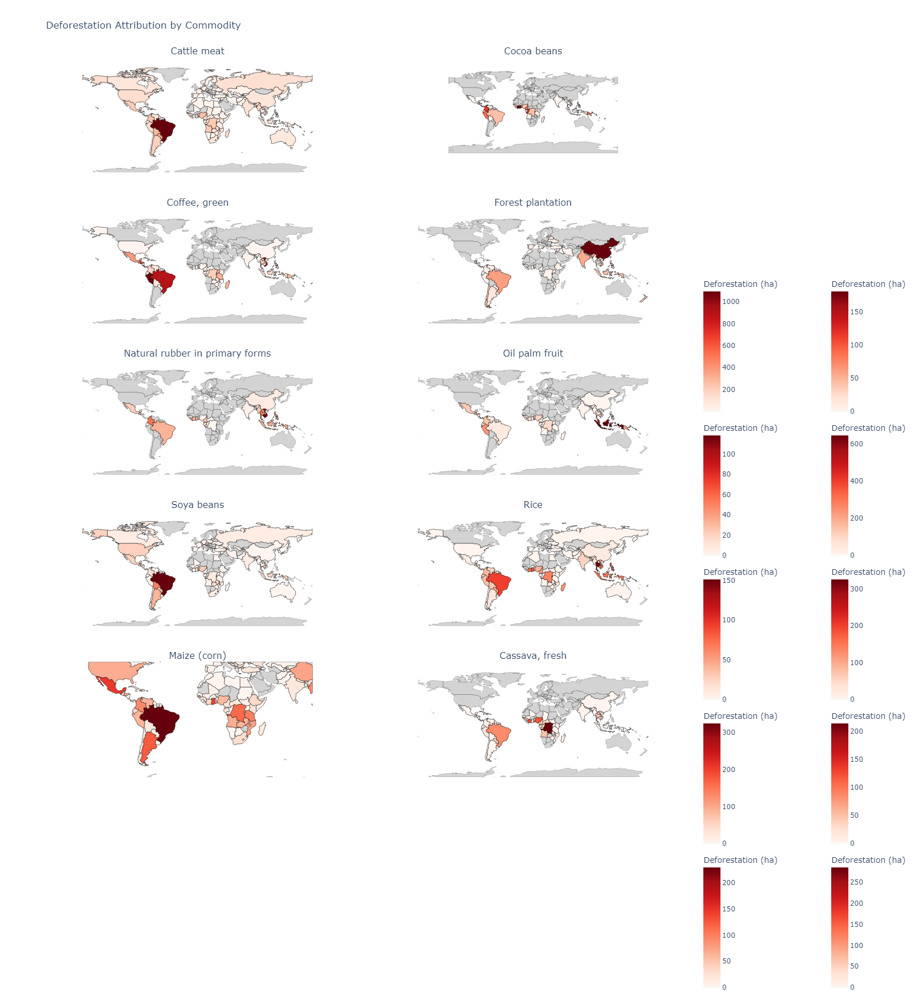

In [491]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# Example setup
# Def_att = pd.read_csv('path_to_your_data.csv')  # Load your data here

commodities = ['Cattle meat', 'Cocoa beans', 'Coffee, green', 'Forest plantation', 'Natural rubber in primary forms', 
               'Oil palm fruit', 'Soya beans', 'Rice', 'Maize (corn)', 'Cassava, fresh']

# Calculate the number of rows needed (two plots per row)
num_cols = 2
num_rows = (len(commodities) + 1) // num_cols

# Create subplots with reduced space
fig = make_subplots(
    rows=num_rows, 
    cols=num_cols,
    subplot_titles=commodities,
    specs=[[{'type': 'choropleth'} for _ in range(num_cols)] for _ in range(num_rows)],
    horizontal_spacing=0.05,  # Reduce horizontal space
    vertical_spacing=0.05     # Reduce vertical space
)

# Load country lookup codes
Country_lookup_codes = pd.read_excel('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Supplementary_data-DeDuCE v1.xlsx', 'Lookup-Country (GADM)')

# Add each plot to the corresponding subplot
for i, commodity in enumerate(commodities):
    row = (i // num_cols) + 1
    col = (i % num_cols) + 1
    
    if commodity == 'Forest plantation':
        grouped_producer_deforestation = Def_att.loc[Def_att['Commodity'].str.startswith('Forest plantation')]
    else:
        grouped_producer_deforestation = Def_att.loc[Def_att['Commodity'] == commodity]
    grouped_producer_deforestation = grouped_producer_deforestation.loc[grouped_producer_deforestation['Deforestation risk, amortized (ha)'] != 0]
    grouped_producer_deforestation = grouped_producer_deforestation[['Producer country', 'Deforestation risk, amortized (ha)']].groupby(['Producer country']).sum(numeric_only=True).reset_index()
    grouped_producer_deforestation['ISO'] = grouped_producer_deforestation['Producer country'].map(Country_lookup_codes.set_index('COUNTRY')['GID_0'])
    
    trace = go.Choropleth(
        locations=grouped_producer_deforestation['ISO'],
        z=grouped_producer_deforestation['Deforestation risk, amortized (ha)']**0.5,
        text=grouped_producer_deforestation['Producer country'],
        colorscale='Reds_r',
        autocolorscale=False,
        reversescale=True,
        marker_line_color='black',
        marker_line_width=0.5,
        colorbar=dict(
            title='Deforestation (ha)',
            len=0.2,
            yanchor='middle',
            xanchor='left',
            x=1.02 if col == 1 else 1.22,
            y=0.5 - (row-1) * (1 / num_rows) + (0.5 / num_rows)
        ),  # Individual colorbar
    )
    
    fig.add_trace(trace, row=row, col=col)

# Update layout for the entire figure
fig.update_layout(
    title_text='Deforestation Attribution by Commodity',
    autosize=False,
    width=1300,
    height=700 * num_rows / 2,
    showlegend=False,
)

# Update geo settings for each subplot to maintain same level of zoom
for i in range(1, num_rows * num_cols + 1):
    fig.update_geos(
        visible=False,
        showsubunits=True,
        subunitcolor="lightgrey",
        showland=True,
        landcolor="lightgrey",
        showcountries=True,
        countrycolor="black",
        countrywidth=0.2,
        projection_type='equirectangular',  # Set projection type
        center=dict(lat=10, lon=0),  # Set the center to ensure same zoom level
        row=(i - 1) // num_cols + 1,
        col=(i - 1) % num_cols + 1
    )

fig.show()
fig.write_image('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Figures/Figure5legend.svg')

In [45]:
# Custom function to calculate the weighted mean
def weighted_mean(group):
    quality_index = group['Quality Index']
    weights = group['Deforestation attribution, unamortized (ha)']
    try:
        return (quality_index * weights).sum() / weights.sum()
    except ZeroDivisionError:
        return np.nan

In [46]:
Def_att = pd.read_excel('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Generated_results/DeDuCE_Deforestation_attribution_v1.0.1 (2001-2022).xlsx', 'Deforestation attribution')

In [47]:
Def_att = Def_att.loc[(Def_att['Year'] >= 2018)]
Def_att.loc[Def_att['Commodity'].str.startswith('Forest plantation'), 'Commodity'] = 'Forest plantation'

In [48]:
Def_att = Def_att[['Producer country', 'Commodity', 'Deforestation attribution, unamortized (ha)', 'Quality Index']].groupby(['Producer country', 'Commodity']).apply(
                lambda group: pd.Series({
                    'Deforestation attribution, unamortized (ha)': group['Deforestation attribution, unamortized (ha)'].sum(),
                    'Quality Index': weighted_mean(group)})
                ).reset_index()

/tmp/user/1011/ipykernel_406661/2138533399.py:6: RuntimeWarning: invalid value encountered in double_scalars
  return (quality_index * weights).sum() / weights.sum()
/tmp/user/1011/ipykernel_406661/2138533399.py:6: RuntimeWarning: invalid value encountered in double_scalars
  return (quality_index * weights).sum() / weights.sum()
/tmp/user/1011/ipykernel_406661/2138533399.py:6: RuntimeWarning: invalid value encountered in double_scalars
  return (quality_index * weights).sum() / weights.sum()
/tmp/user/1011/ipykernel_406661/2138533399.py:6: RuntimeWarning: invalid value encountered in double_scalars
  return (quality_index * weights).sum() / weights.sum()
/tmp/user/1011/ipykernel_406661/2138533399.py:6: RuntimeWarning: invalid value encountered in double_scalars
  return (quality_index * weights).sum() / weights.sum()
/tmp/user/1011/ipykernel_406661/2138533399.py:6: RuntimeWarning: invalid value encountered in double_scalars
  return (quality_index * weights).sum() / weights.sum()
/tmp

In [49]:
Def_att['Deforestation attribution, unamortized (ha)'] = Def_att['Deforestation attribution, unamortized (ha)']/5

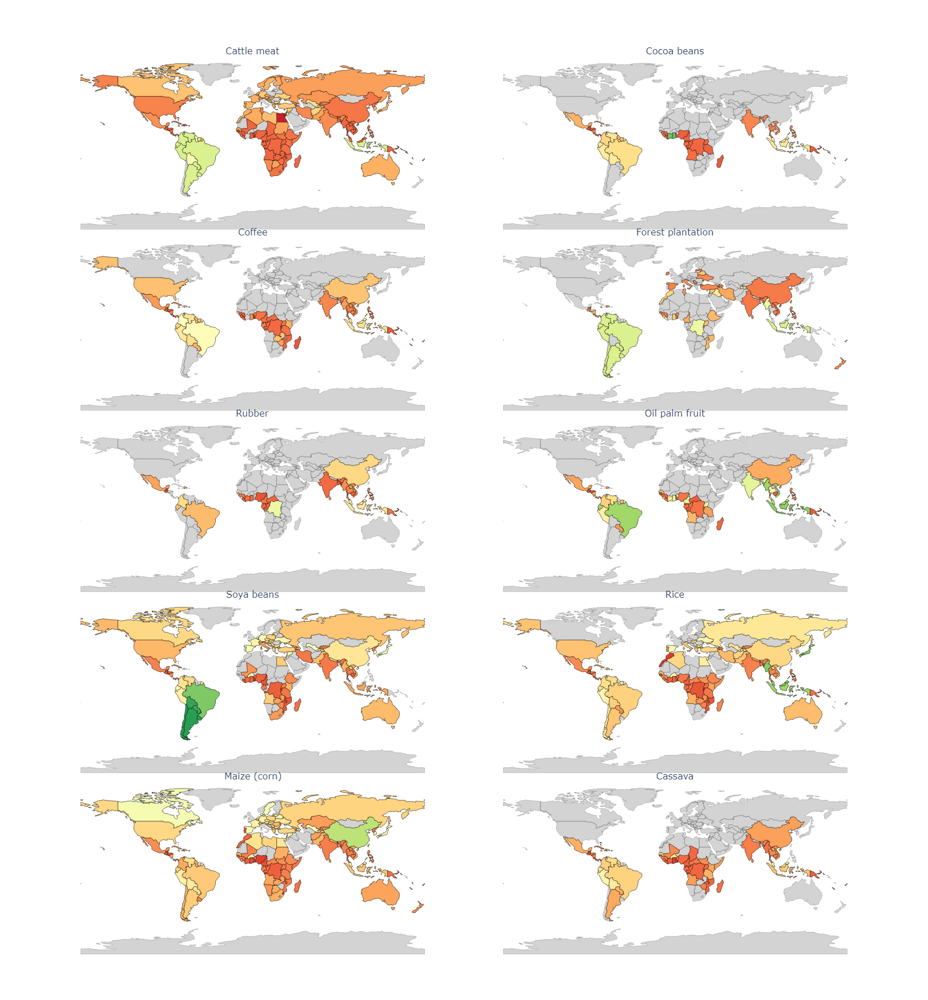

In [50]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd

# Example setup
# Def_att = pd.read_csv('path_to_your_data.csv')  # Load your data here

commodities = ['Cattle meat', 'Cocoa beans', 'Coffee, green', 'Forest plantation', 'Natural rubber in primary forms', 
               'Oil palm fruit', 'Soya beans', 'Rice', 'Maize (corn)', 'Cassava, fresh']

# Calculate the number of rows needed (two plots per row)
num_cols = 2
num_rows = (len(commodities) + 1) // num_cols

# Create subplots with reduced space
fig = make_subplots(
    rows=num_rows, 
    cols=num_cols,
    subplot_titles=('Cattle meat', 'Cocoa beans', 'Coffee', 'Forest plantation', 'Rubber', 'Oil palm fruit', 'Soya beans', 'Rice', 'Maize (corn)', 'Cassava'),
    specs=[[{'type': 'choropleth'} for _ in range(num_cols)] for _ in range(num_rows)],
    horizontal_spacing=0.01,  # Reduce horizontal space
    vertical_spacing=0.01,     # Reduce vertical space
)

# Load country lookup codes
Country_lookup_codes = pd.read_excel('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Supplementary_data-DeDuCE v1.xlsx', 'Lookup-Country (GADM)')

# Add each plot to the corresponding subplot
for i, commodity in enumerate(commodities):
    row = (i // num_cols) + 1
    col = (i % num_cols) + 1
    
    if commodity == 'Forest plantation':
        grouped_producer_deforestation = Def_att.loc[Def_att['Commodity'].str.startswith('Forest plantation')]
    else:
        grouped_producer_deforestation = Def_att.loc[Def_att['Commodity'] == commodity]
    grouped_producer_deforestation = grouped_producer_deforestation.loc[grouped_producer_deforestation['Deforestation attribution, unamortized (ha)'] != 0]
    grouped_producer_deforestation = grouped_producer_deforestation[['Producer country', 'Quality Index']].groupby(['Producer country']).sum(numeric_only=True).reset_index()
    grouped_producer_deforestation['ISO'] = grouped_producer_deforestation['Producer country'].map(Country_lookup_codes.set_index('COUNTRY')['GID_0'])
    
    trace = go.Choropleth(
        locations=grouped_producer_deforestation['ISO'],
        z=grouped_producer_deforestation['Quality Index'],
        text=grouped_producer_deforestation['Producer country'],
        colorscale='RdYlGn_r',
        autocolorscale=False,
        reversescale=True,
        marker_line_color='black',
        marker_line_width=0.5,
        colorbar=dict(title='Deforestation (ha)', len=0.3),  # Individual colorbar
    )
    
    fig.add_trace(trace, row=row, col=col)
    fig.update_traces(zmax=1, zmin=0, showscale=False)

# Update layout for the entire figure
fig.update_layout(
    #title_text='Deforestation Attribution by Commodity',
    autosize=False,
    width=1300,
    height=700 * num_rows / 2,
    showlegend=False,
)

# Update geo settings for each subplot
for i in range(1, num_rows * num_cols + 1):
    fig.update_geos(
        visible=False,
        showsubunits=True,
        subunitcolor="lightgrey",
        showland=True,
        landcolor="lightgrey",
        showcountries=True,
        countrycolor="black",
        countrywidth = 0.2,
        row=(i - 1) // num_cols + 1,
        col=(i - 1) % num_cols + 1
    )


fig.show()
#fig.write_image('/home/chandra/backup/Chalmers/DeDuCE v1.0.1 (2001-2022)/Figures/Figure5legend.svg')